# Regression Models Based on Socio-economic Factors

| Contribution   |
| :---   |
| Leonardo Villamil  |
| Litian Chen        |

In [1]:
# numpy handles pretty much anything that is a number/vector/matrix/array
import numpy as np

# pandas handles dataframes (exactly the same as tables in Matlab)
import pandas as pd

# matplotlib emulates Matlabs plotting functionality
import matplotlib.pyplot as plt

# stats models is a package that is going to perform the regression analysis
from statsmodels import api as sm
#from scipy import stats
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.linear_model import Lasso, Ridge
from sklearn.preprocessing import StandardScaler

# Funtion for splitting the data
from sklearn.model_selection import train_test_split

In [2]:
# Funtions Definition

def adj_r2(actual, predicted, X):
    n = X.shape[0]
    p = X.shape[1]
    r2 = r2_score(actual, predicted)
    adjr2 = 1 - (1 - r2) * (n - 1) / (n - p - 1);
    return adjr2

In [3]:
communities = pd.read_csv('./Data/Q1/communities.csv')
print('communities data size:' + str(communities.shape))
communities.head()

communities data size:(1994, 128)


,state,county,community,communityname string,fold,population,householdsize,racepctblack,racePctWhite,racePctAsian,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
0,8,?,?,Lakewoodcity,1,0.19,0.33,0.02,0.90,0.12,...,0.12,0.26,0.20,0.06,0.04,0.9,0.5,0.32,0.14,0.20
1,53,?,?,Tukwilacity,1,0.00,0.16,0.12,0.74,0.45,...,0.02,0.12,0.45,?,?,?,?,0.00,?,0.67
2,24,?,?,Aberdeentown,1,0.00,0.42,0.49,0.56,0.17,...,0.01,0.21,0.02,?,?,?,?,0.00,?,0.43
3,34,5,81440,Willingborotownship,1,0.04,0.77,1.00,0.08,0.12,...,0.02,0.39,0.28,?,?,?,?,0.00,?,0.12
4,42,95,6096,Bethlehemtownship,1,0.01,0.55,0.02,0.95,0.09,...,0.04,0.09,0.02,?,?,?,?,0.00,?,0.03


## Data handle and sanitizing

In [4]:
#Remove First 5 Columns
columns_to_remove = communities.columns.values[0:5]
print('Colums to remove: %s' %columns_to_remove)
communities.drop(columns_to_remove, axis=1, inplace=True)
communities.head()

Colums to remove: [' state ' ' county ' ' community ' ' communityname string' ' fold ']


,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,agePct12t29,agePct16t24,agePct65up,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
0,0.19,0.33,0.02,0.90,0.12,0.17,0.34,0.47,0.29,0.32,...,0.12,0.26,0.20,0.06,0.04,0.9,0.5,0.32,0.14,0.20
1,0.00,0.16,0.12,0.74,0.45,0.07,0.26,0.59,0.35,0.27,...,0.02,0.12,0.45,?,?,?,?,0.00,?,0.67
2,0.00,0.42,0.49,0.56,0.17,0.04,0.39,0.47,0.28,0.32,...,0.01,0.21,0.02,?,?,?,?,0.00,?,0.43
3,0.04,0.77,1.00,0.08,0.12,0.10,0.51,0.50,0.34,0.21,...,0.02,0.39,0.28,?,?,?,?,0.00,?,0.12
4,0.01,0.55,0.02,0.95,0.09,0.05,0.38,0.38,0.23,0.36,...,0.04,0.09,0.02,?,?,?,?,0.00,?,0.03


In [5]:
#Check for missing Values
print('Sum of NaN values per column:')
print(np.sum(communities.isna()).to_string())

#Visually checking the data, it can be observed that the missing values are recorded as "?"
communities.replace('?', np.nan, inplace=True)
print('\n Sum of NaN values per column after "?" replacement:')
print(np.sum(communities.isna()).to_string())

#Remove Columns with 1675 missing values
columns_to_remove = []
for column in communities.columns.values:
  if np.sum(communities[column].isna()) == 1675:
    # add this column to the list that should be removed
    columns_to_remove.append(column)
print('\n Colums to remove with missing values: %s' %columns_to_remove)
communities.drop(columns_to_remove, axis=1, inplace=True)

Sum of NaN values per column:
 population                0
 householdsize             0
 racepctblack              0
 racePctWhite              0
 racePctAsian              0
 racePctHisp               0
 agePct12t21               0
 agePct12t29               0
 agePct16t24               0
 agePct65up                0
 numbUrban                 0
 pctUrban                  0
 medIncome                 0
 pctWWage                  0
 pctWFarmSelf              0
 pctWInvInc                0
 pctWSocSec                0
 pctWPubAsst               0
 pctWRetire                0
 medFamInc                 0
 perCapInc                 0
 whitePerCap               0
 blackPerCap               0
 indianPerCap              0
 AsianPerCap               0
 OtherPerCap               0
 HispPerCap                0
 NumUnderPov               0
 PctPopUnderPov            0
 PctLess9thGrade           0
 PctNotHSGrad              0
 PctBSorMore               0
 PctUnemployed             0
 PctEmploy   

In [6]:
#Finally, we drop any rows that contain a NaN.
communities.dropna(axis=0,inplace=True)
print('communities data size:' + str(communities.shape))

communities data size:(1993, 101)


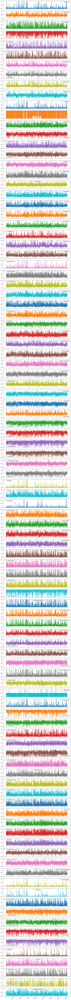

In [7]:
#Plot each variable to visually check the integrity of the data
communities.plot(figsize=(12, 200),subplots=True);

## Data Splitting

In [8]:
# Data Split: 70% Training - 15% Testing - 15% Validation
communities_y = communities[' ViolentCrimesPerPop ']
communities_X = communities.drop(' ViolentCrimesPerPop ',axis=1)

X_train, X_test, y_train, y_test = train_test_split(communities_X, communities_y, test_size=int(.15*len(communities)), random_state=1)

X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=int(.15*len(communities)), random_state=1)

y_train = np.array(y_train, dtype=np.float64)
X_train = np.array(X_train, dtype=np.float64)
X_train = sm.add_constant(X_train)

y_val = np.array(y_val, dtype=np.float64)
X_val = np.array(X_val, dtype=np.float64)
X_val = sm.add_constant(X_val)

y_test = np.array(y_test, dtype=np.float64)
X_test = np.array(X_test, dtype=np.float64)
X_test = sm.add_constant(X_test)

## Linear Regression Model

Model 1 RMSE = 0.12519661418204486 

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.718
Model:                            OLS   Adj. R-squared:                  0.696
Method:                 Least Squares   F-statistic:                     32.99
Date:                Mon, 05 Apr 2021   Prob (F-statistic):          3.65e-288
Time:                        13:23:45   Log-Likelihood:                 920.53
No. Observations:                1397   AIC:                            -1639.
Df Residuals:                    1296   BIC:                            -1110.
Df Model:                         100                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------

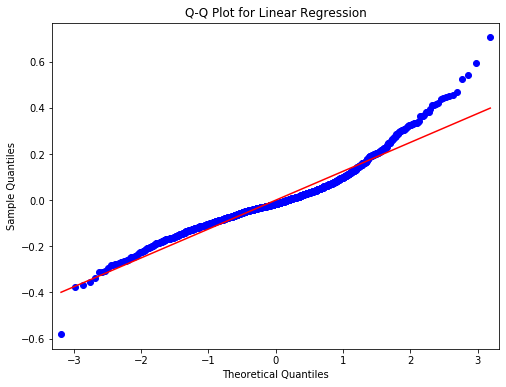

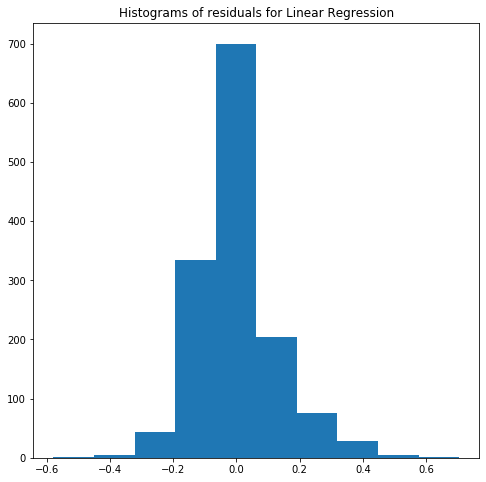

In [9]:
# create and fit the linear model
model1 = sm.OLS(y_train, X_train)
model1.exog_names[:] = [' constant '] + list(communities_X.columns.values)
model1 = model1.fit()

pred_train = model1.predict(X_train)
linear_model_pred_train = pred_train # Copy for final plot
RMSE_train = np.sqrt(mean_squared_error(y_train, pred_train))
print('Model 1 RMSE = {} \n'.format(RMSE_train))
print(model1.summary())

fig, ax = plt.subplots(figsize=(8,6))
sm.qqplot(model1.resid, ax=ax, line='s')
plt.title('Q-Q Plot for Linear Regression')
plt.show()

fig = plt.figure(figsize=[8, 8])
ax = fig.add_subplot(1, 1, 1)
plt.title('Histograms of residuals for Linear Regression')
ax.hist(model1.resid);

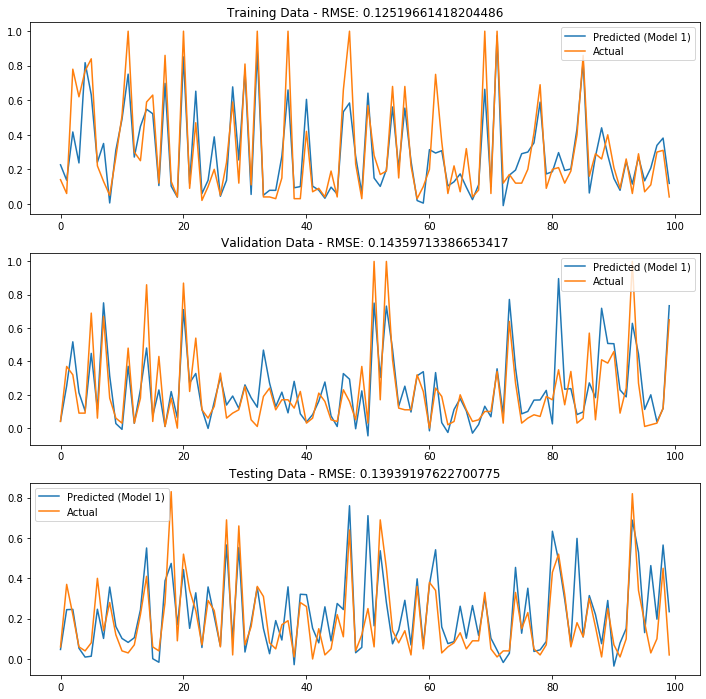

In [10]:
pred_val = model1.predict(X_val)
linear_model_pred_val = pred_val
RMSE_val = np.sqrt(mean_squared_error(y_val, pred_val))
pred_test = model1.predict(X_test)
linear_model_pred_test = pred_test
RMSE_test = np.sqrt(mean_squared_error(y_test, pred_test))

fig = plt.figure(figsize=[12, 12])
ax = fig.add_subplot(3, 1, 1)
ax.plot(pred_train[0:100], label='Predicted (Model 1)')
ax.plot(y_train[0:100], label='Actual')
ax.set_title('Training Data - RMSE: %s' %RMSE_train)
ax.legend()

ax = fig.add_subplot(3, 1, 2)
ax.plot(pred_val[0:100], label='Predicted (Model 1)')
ax.plot(y_val[0:100], label='Actual')
ax.set_title('Validation Data - RMSE: %s' %RMSE_val)
ax.legend()

ax = fig.add_subplot(3, 1, 3)
ax.plot(pred_test[0:100], label='Predicted (Model 1)')
ax.plot(y_test[0:100], label='Actual')
ax.set_title('Testing Data - RMSE: %s' %RMSE_test)
ax.legend();

## Ridge (L2) Regularisation

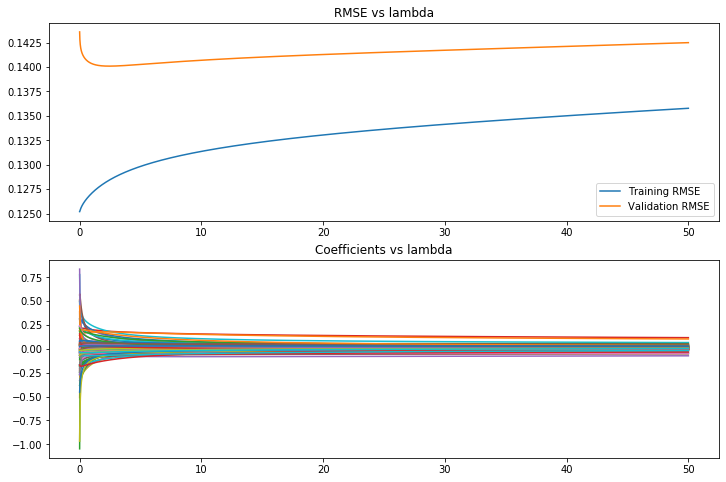

In [11]:
lambdas = np.arange(0, 50, 0.01)
rmse_train = []
rmse_validation = []
coeffs = []
for l in lambdas:
    model2 = Ridge(fit_intercept=False, alpha=l).fit(X_train, y_train)
    coeffs.append(model2.coef_)
    rmse_train.append(mean_squared_error(y_train, model2.predict(X_train),squared=False)) 
    rmse_validation.append(mean_squared_error(y_val, model2.predict(X_val),squared=False))
    
fig = plt.figure(figsize=[12, 8])
ax = fig.add_subplot(2, 1, 1)
ax.set_title('RMSE vs lambda')
ax.plot(lambdas, rmse_train, label='Training RMSE')
ax.plot(lambdas, rmse_validation, label='Validation RMSE')
ax.legend()
ax = fig.add_subplot(2, 1, 2)
ax.set_title('Coefficients vs lambda')
ax.plot(lambdas, coeffs);

Selected lambda: 2.43
Model 2 RMSE = 0.1284182840118538
Model 2 R-square = 0.703241593393672
Model 2 Adjusted R-square = 0.6800967292490858 



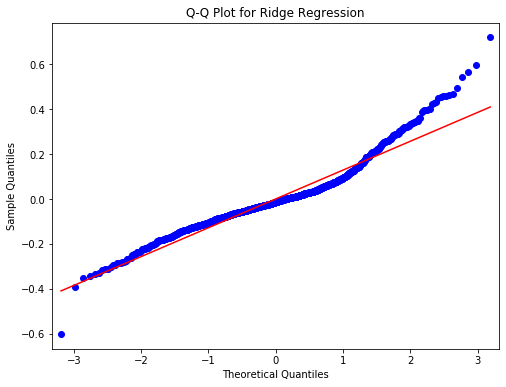

In [12]:
#Lalambda that generates the minimun RMSE in the validation dataset
best_lambda = lambdas[np.argmin(rmse_validation)]
print('Selected lambda: %s' %best_lambda)

model2 = Ridge(fit_intercept=False, alpha=best_lambda).fit(X_train, y_train)
pred_train = model2.predict(X_train)
RMSE_train = mean_squared_error(y_train, pred_train, squared=False)
print('Model 2 RMSE = {}'.format(RMSE_train))
R2_train = r2_score(y_train, pred_train)
print('Model 2 R-square = {}'.format(R2_train))
Adj_R2_train = adj_r2(y_train, pred_train, X_train)
print('Model 2 Adjusted R-square = {} \n'.format(Adj_R2_train))

resid = y_train - pred_train
fig, ax = plt.subplots(figsize=(8,6))
sm.qqplot(resid, ax=ax, line='s')
plt.title('Q-Q Plot for Ridge Regression')
plt.show();

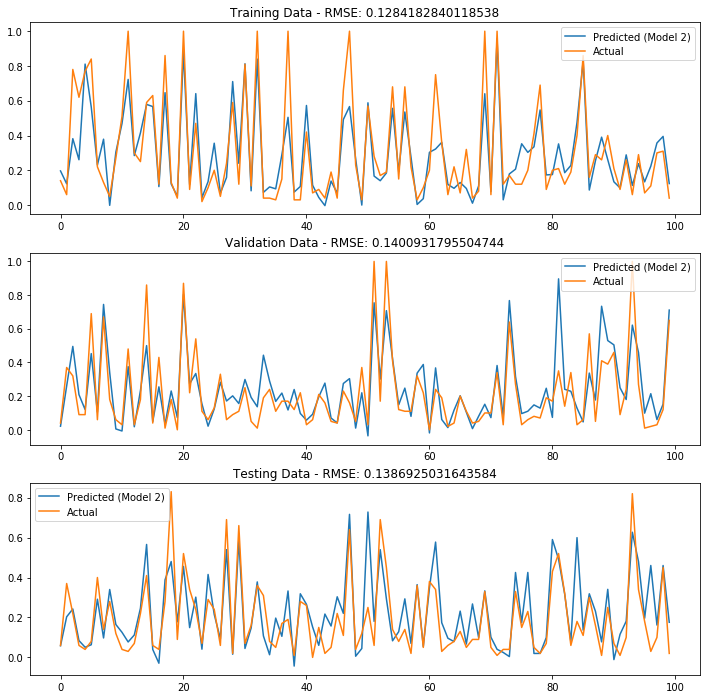

In [13]:
pred_val = model2.predict(X_val)
RMSE_val = np.sqrt(mean_squared_error(y_val, pred_val))
pred_test = model2.predict(X_test)
RMSE_test = np.sqrt(mean_squared_error(y_test, pred_test))

fig = plt.figure(figsize=[12, 12])
ax = fig.add_subplot(3, 1, 1)
ax.plot(pred_train[0:100], label='Predicted (Model 2)')
ax.plot(y_train[0:100], label='Actual')
ax.set_title('Training Data - RMSE: %s' %RMSE_train)
ax.legend()

ax = fig.add_subplot(3, 1, 2)
ax.plot(pred_val[0:100], label='Predicted (Model 2)')
ax.plot(y_val[0:100], label='Actual')
ax.set_title('Validation Data - RMSE: %s' %RMSE_val)
ax.legend()

ax = fig.add_subplot(3, 1, 3)
ax.plot(pred_test[0:100], label='Predicted (Model 2)')
ax.plot(y_test[0:100], label='Actual')
ax.set_title('Testing Data - RMSE: %s' %RMSE_test)
ax.legend();

## Lasso (L1) Regularisation

<ipython-input-14-49a7b78ba749>:6: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  model3 = Lasso(fit_intercept=False, alpha=l).fit(X_train, y_train)
/home/leonardo/CAB420-env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/home/leonardo/CAB420-env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11.055239020808918, tolerance: 0.01597988
  model = cd_fast.enet_coordinate_descent(
/home/leonardo/CAB420-env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.203

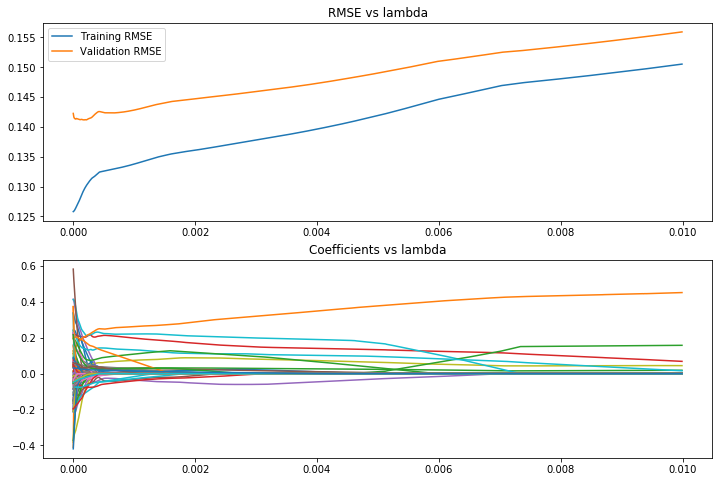

In [14]:
lambdas = np.arange(0.0, 0.01, 0.00001)
rmse_train = []
rmse_validation = []
coeffs = []
for l in lambdas:
    model3 = Lasso(fit_intercept=False, alpha=l).fit(X_train, y_train)
    coeffs.append(model3.coef_)
    rmse_train.append(mean_squared_error(y_train, model3.predict(X_train),squared=False)) 
    rmse_validation.append(mean_squared_error(y_val, model3.predict(X_val),squared=False))
    
fig = plt.figure(figsize=[12, 8])
ax = fig.add_subplot(2, 1, 1)
ax.set_title('RMSE vs lambda')
ax.plot(lambdas, rmse_train, label='Training RMSE')
ax.plot(lambdas, rmse_validation, label='Validation RMSE')
ax.legend()
ax = fig.add_subplot(2, 1, 2)
ax.set_title('Coefficients vs lambda')
ax.plot(lambdas, coeffs);

Selected lambda: 0.00018
Model 3 RMSE = 0.1251966262545114
Model 3 R-square = 0.7179445098998565
Model 3 Adjusted R-square = 0.6959463597067179 



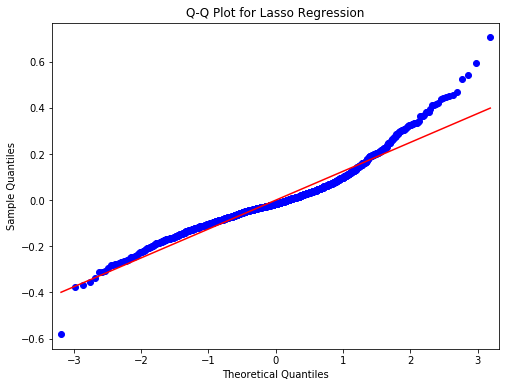

In [15]:
#Lalambda that generates the minimun RMSE in the validation dataset
best_lambda = lambdas[np.argmin(rmse_validation)]
print('Selected lambda: %s' %best_lambda)

model3 = Ridge(fit_intercept=False, alpha=best_lambda).fit(X_train, y_train)
pred_train = model3.predict(X_train)
RMSE_train = mean_squared_error(y_train, pred_train, squared=False)
print('Model 3 RMSE = {}'.format(RMSE_train))
R2_train = r2_score(y_train, pred_train)
print('Model 3 R-square = {}'.format(R2_train))
Adj_R2_train = adj_r2(y_train, pred_train, X_train)
print('Model 3 Adjusted R-square = {} \n'.format(Adj_R2_train))

resid = y_train - pred_train
fig, ax = plt.subplots(figsize=(8,6))
sm.qqplot(resid, ax=ax, line='s')
plt.title('Q-Q Plot for Lasso Regression')
plt.show();

Number of Coefficients equal to 0: 0 



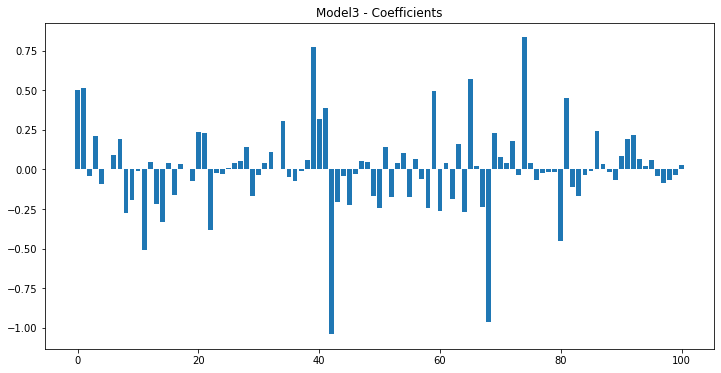

In [16]:
print('Number of Coefficients equal to 0: %s \n' %sum(model3.coef_ == 0))

#Lasso Coeff
fig = plt.figure(figsize=[12, 6])
ax = fig.add_subplot(1, 1, 1)
ax.bar(range(len(model3.coef_)), model3.coef_)
ax.set_title('Model3 - Coefficients');

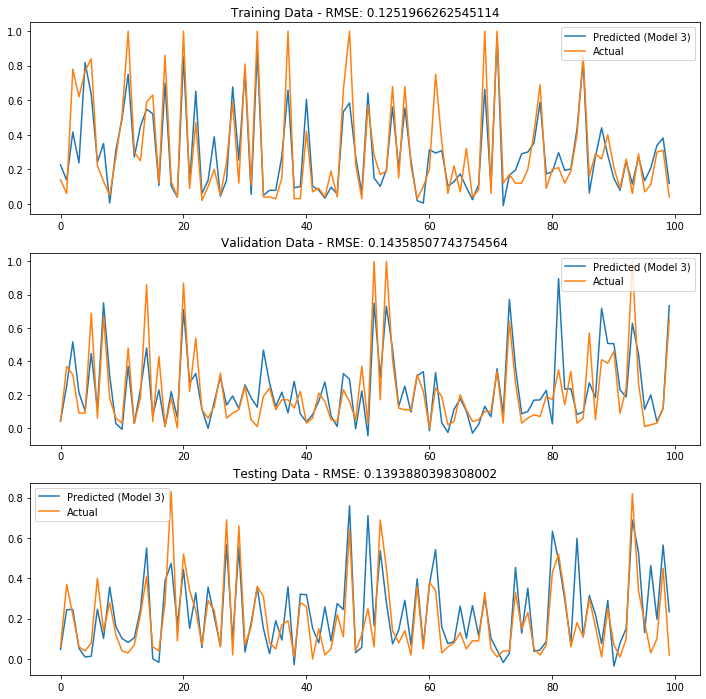

In [17]:
pred_val = model3.predict(X_val)
RMSE_val = np.sqrt(mean_squared_error(y_val, pred_val))
pred_test = model3.predict(X_test)
RMSE_test = np.sqrt(mean_squared_error(y_test, pred_test))

fig = plt.figure(figsize=[12, 12])
ax = fig.add_subplot(3, 1, 1)
ax.plot(pred_train[0:100], label='Predicted (Model 3)')
ax.plot(y_train[0:100], label='Actual')
ax.set_title('Training Data - RMSE: %s' %RMSE_train)
ax.legend()

ax = fig.add_subplot(3, 1, 2)
ax.plot(pred_val[0:100], label='Predicted (Model 3)')
ax.plot(y_val[0:100], label='Actual')
ax.set_title('Validation Data - RMSE: %s' %RMSE_val)
ax.legend()

ax = fig.add_subplot(3, 1, 3)
ax.plot(pred_test[0:100], label='Predicted (Model 3)')
ax.plot(y_test[0:100], label='Actual')
ax.set_title('Testing Data - RMSE: %s' %RMSE_test)
ax.legend();

## Final Evaluation - No Standardise

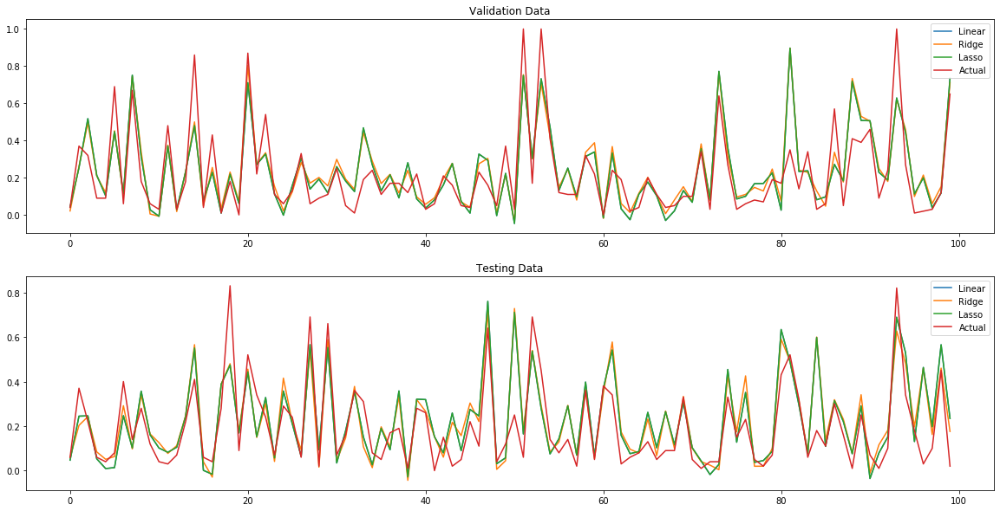

In [18]:
fig = plt.figure(figsize=[20, 10])
ax = fig.add_subplot(2, 1, 1)
ax.plot(model1.predict(X_val)[0:100], label='Linear')
ax.plot(model2.predict(X_val)[0:100], label='Ridge')
ax.plot(model3.predict(X_val)[0:100], label='Lasso')
ax.plot(y_val[0:100], label='Actual')
ax.legend()
ax.set_title('Validation Data')
ax = fig.add_subplot(2, 1, 2)
ax.plot(model1.predict(X_test)[0:100], label='Linear')
ax.plot(model2.predict(X_test)[0:100], label='Ridge')
ax.plot(model3.predict(X_test)[0:100], label='Lasso')
ax.plot(y_test[0:100], label='Actual')
ax.legend()
ax.set_title('Testing Data');

In [19]:
print('Linear Model, Test RMSE: ' + str(mean_squared_error(y_test, model1.predict(X_test),squared=False)))
print('Ridge Model, Test RMSE:  ' + str(mean_squared_error(y_test, model2.predict(X_test),squared=False)))
print('Lasso Model, Test RMSE:  ' + str(mean_squared_error(y_test, model3.predict(X_test),squared=False)))

Linear Model, Test RMSE: 0.13939197622700775
Ridge Model, Test RMSE:  0.1386925031643584
Lasso Model, Test RMSE:  0.1393880398308002


# Standardise Data Analysis

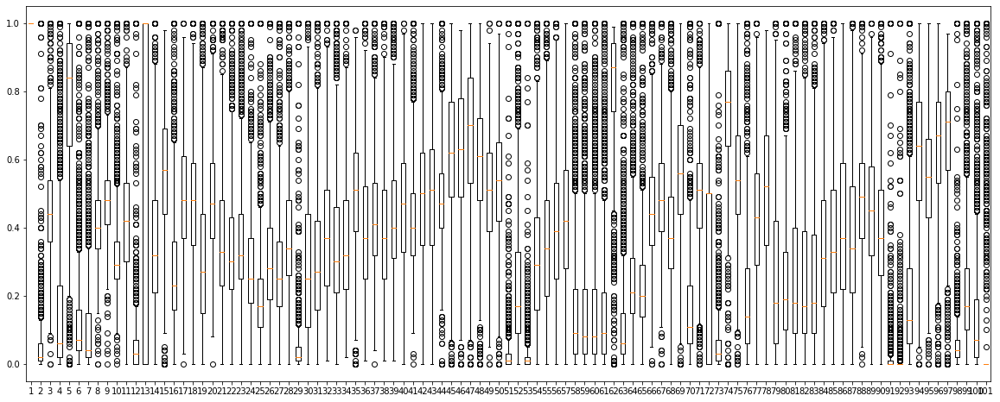

In [20]:
# Box plot of the Training Data
fig = plt.figure(figsize=[20, 8])
ax = fig.add_subplot(1, 1, 1)
ax.boxplot(X_train);

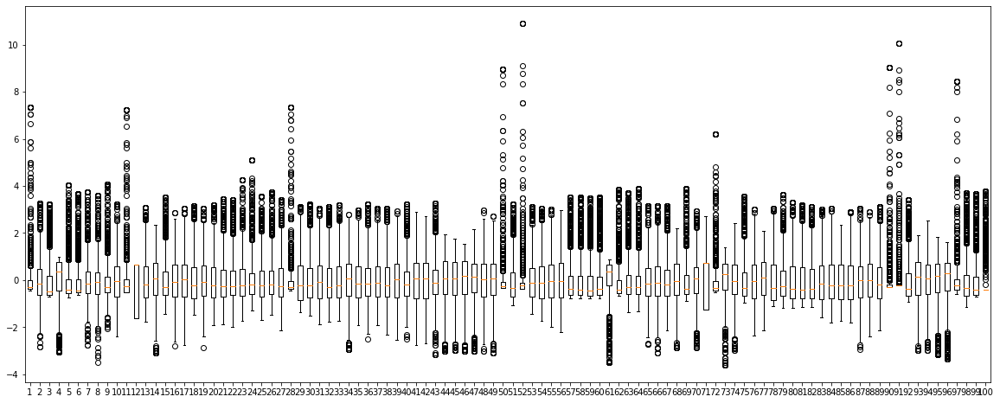

In [21]:
# StandardScaler used to standardise. Scale and Rescale
X_scaler = StandardScaler()
y_scaler = StandardScaler()

X_train_str = X_scaler.fit_transform(X_train[:,1:])
y_train_str = y_scaler.fit_transform(y_train.reshape(-1,1))
y_train_str = y_train_str.reshape(-1,)

X_val_str = X_scaler.transform(X_val[:,1:])
X_test_str = X_scaler.transform(X_test[:,1:])

y_val_str = y_scaler.transform(y_val.reshape(-1,1))
y_val_str = y_val_str.reshape(-1,)

fig = plt.figure(figsize=[20, 8])
ax = fig.add_subplot(1, 1, 1)
ax.boxplot(X_train_str);

## Ridge (L2) Regularisation with Standardised Data

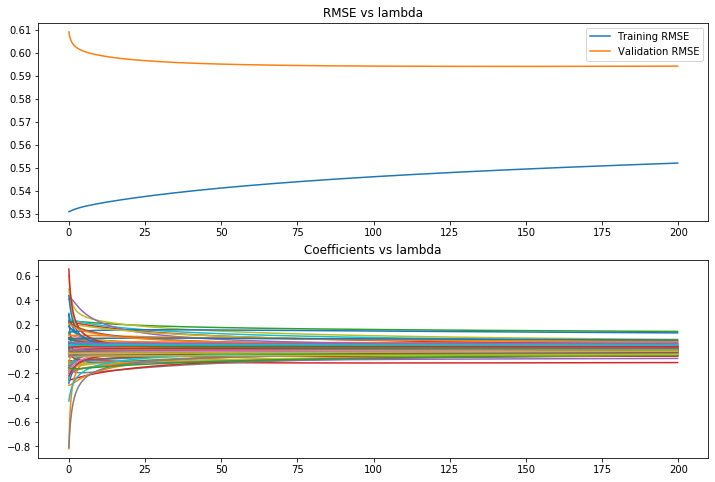

In [22]:
lambdas = np.arange(0, 200, 0.2)
rmse_train = []
rmse_validation = []
coeffs = []
for l in lambdas:
    model4 = Ridge(fit_intercept=False, alpha=l).fit(X_train_str, y_train_str)
    coeffs.append(model4.coef_)
    rmse_train.append(mean_squared_error(y_train_str, model4.predict(X_train_str),squared=False)) 
    rmse_validation.append(mean_squared_error(y_val_str, model4.predict(X_val_str),squared=False))
    
fig = plt.figure(figsize=[12, 8])
ax = fig.add_subplot(2, 1, 1)
ax.set_title('RMSE vs lambda')
ax.plot(lambdas, rmse_train, label='Training RMSE')
ax.plot(lambdas, rmse_validation, label='Validation RMSE')
ax.legend()
ax = fig.add_subplot(2, 1, 2)
ax.set_title('Coefficients vs lambda')
ax.plot(lambdas, coeffs);

Selected lambda: 144.20000000000002
Model 4 RMSE = 0.12947730960525608
Model 4 R-square = 0.6983268631733704
Model 4 Adjusted R-square = 0.6747986880231854 



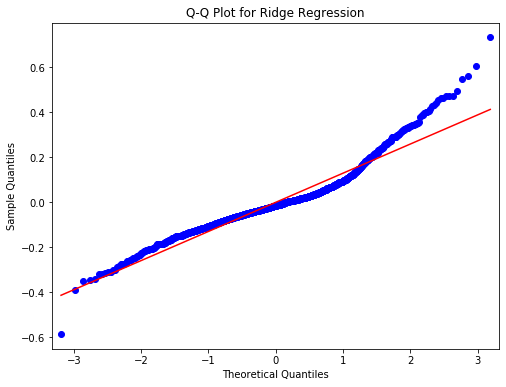

In [23]:
#Lalambda that generates the minimun RMSE in the validation dataset
best_lambda = lambdas[np.argmin(rmse_validation)]
print('Selected lambda: %s' %best_lambda)

model4 = Ridge(fit_intercept=False, alpha=best_lambda).fit(X_train_str, y_train_str)
pred_train = model4.predict(X_train_str)
pred_train = y_scaler.inverse_transform(pred_train).reshape(-1,) #This rescale the prediction to the original data scale
ridge_model_pred_train = pred_train # Copy for final plot

RMSE_train = mean_squared_error(y_train, pred_train, squared=False)
print('Model 4 RMSE = {}'.format(RMSE_train))
R2_train = r2_score(y_train, pred_train)
print('Model 4 R-square = {}'.format(R2_train))
Adj_R2_train = adj_r2(y_train, pred_train, X_train)
print('Model 4 Adjusted R-square = {} \n'.format(Adj_R2_train))

resid = y_train - pred_train
fig, ax = plt.subplots(figsize=(8,6))
sm.qqplot(resid, ax=ax, line='s')
plt.title('Q-Q Plot for Ridge Regression')
plt.show();

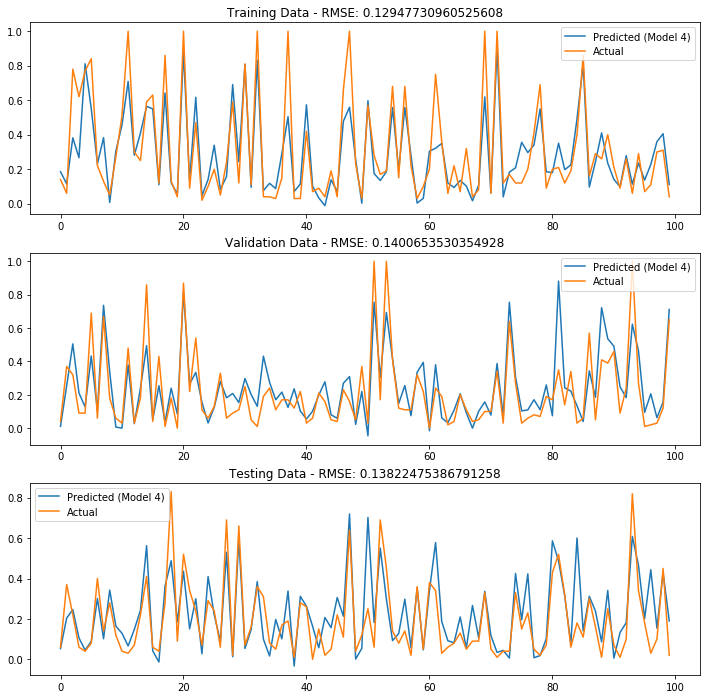

In [24]:
pred_val = model4.predict(X_val_str)
pred_val = y_scaler.inverse_transform(pred_val).reshape(-1,) #This rescale the prediction to the original data scale
ridge_model_pred_val = pred_val # Copy for final plot
RMSE_val = np.sqrt(mean_squared_error(y_val, pred_val))
pred_test = model4.predict(X_test_str)
pred_test = y_scaler.inverse_transform(pred_test).reshape(-1,) #This rescale the prediction to the original data scale
ridge_model_pred_test = pred_test # Copy for final plot
RMSE_test = np.sqrt(mean_squared_error(y_test, pred_test))

fig = plt.figure(figsize=[12, 12])
ax = fig.add_subplot(3, 1, 1)
ax.plot(pred_train[0:100], label='Predicted (Model 4)')
ax.plot(y_train[0:100], label='Actual')
ax.set_title('Training Data - RMSE: %s' %RMSE_train)
ax.legend()

ax = fig.add_subplot(3, 1, 2)
ax.plot(pred_val[0:100], label='Predicted (Model 4)')
ax.plot(y_val[0:100], label='Actual')
ax.set_title('Validation Data - RMSE: %s' %RMSE_val)
ax.legend()

ax = fig.add_subplot(3, 1, 3)
ax.plot(pred_test[0:100], label='Predicted (Model 4)')
ax.plot(y_test[0:100], label='Actual')
ax.set_title('Testing Data - RMSE: %s' %RMSE_test)
ax.legend();

## Lasso (L1) Regularisation with Standardised Data

<ipython-input-25-d64d301961f2>:6: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  model5 = Lasso(fit_intercept=False, alpha=l).fit(X_train_str, y_train_str)
/home/leonardo/CAB420-env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/home/leonardo/CAB420-env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 197.08950860127408, tolerance: 0.1397
  model = cd_fast.enet_coordinate_descent(
/home/leonardo/CAB420-env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1

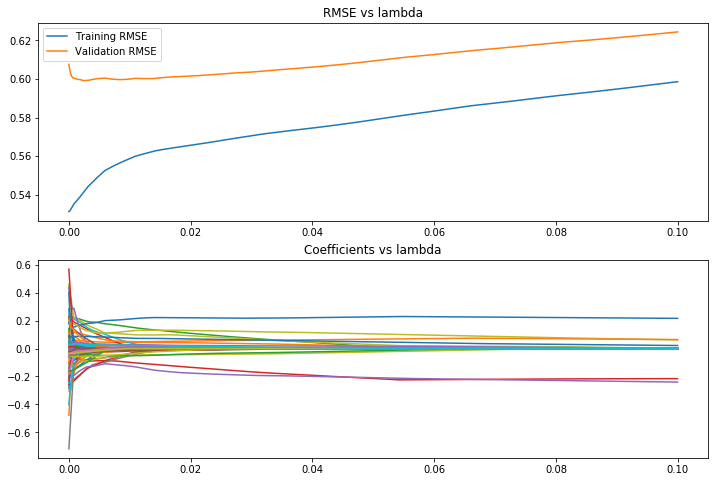

In [25]:
lambdas = np.arange(0.0, 0.1, 0.00002)
rmse_train = []
rmse_validation = []
coeffs = []
for l in lambdas:
    model5 = Lasso(fit_intercept=False, alpha=l).fit(X_train_str, y_train_str)
    coeffs.append(model5.coef_)
    rmse_train.append(mean_squared_error(y_train_str, model5.predict(X_train_str),squared=False)) 
    rmse_validation.append(mean_squared_error(y_val_str, model5.predict(X_val_str),squared=False))
    
fig = plt.figure(figsize=[12, 8])
ax = fig.add_subplot(2, 1, 1)
ax.set_title('RMSE vs lambda')
ax.plot(lambdas, rmse_train, label='Training RMSE')
ax.plot(lambdas, rmse_validation, label='Validation RMSE')
ax.legend()
ax = fig.add_subplot(2, 1, 2)
ax.set_title('Coefficients vs lambda')
ax.plot(lambdas, coeffs);

Selected lambda: 0.00252
Model 5 RMSE = 0.1276759542685938
Model 5 R-square = 0.7066625374761735
Model 5 Adjusted R-square = 0.6837844805534659 



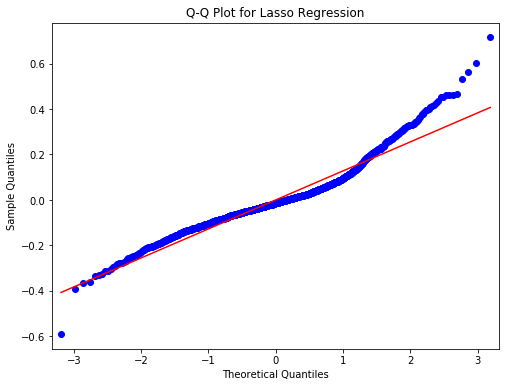

In [26]:
#Lalambda that generates the minimun RMSE in the validation dataset
best_lambda = lambdas[np.argmin(rmse_validation)]
print('Selected lambda: %s' %best_lambda)

model5 = Lasso(fit_intercept=False, alpha=best_lambda).fit(X_train_str, y_train_str)
pred_train = model5.predict(X_train_str)
pred_train = y_scaler.inverse_transform(pred_train).reshape(-1,) #This rescale the prediction to the original data scale
lasso_model_pred_train = pred_train # Copy for final plot

RMSE_train = mean_squared_error(y_train, pred_train, squared=False)
print('Model 5 RMSE = {}'.format(RMSE_train))
R2_train = r2_score(y_train, pred_train)
print('Model 5 R-square = {}'.format(R2_train))
Adj_R2_train = adj_r2(y_train, pred_train, X_train)
print('Model 5 Adjusted R-square = {} \n'.format(Adj_R2_train))

resid = y_train - pred_train
fig, ax = plt.subplots(figsize=(8,6))
sm.qqplot(resid, ax=ax, line='s')
plt.title('Q-Q Plot for Lasso Regression')
plt.show();

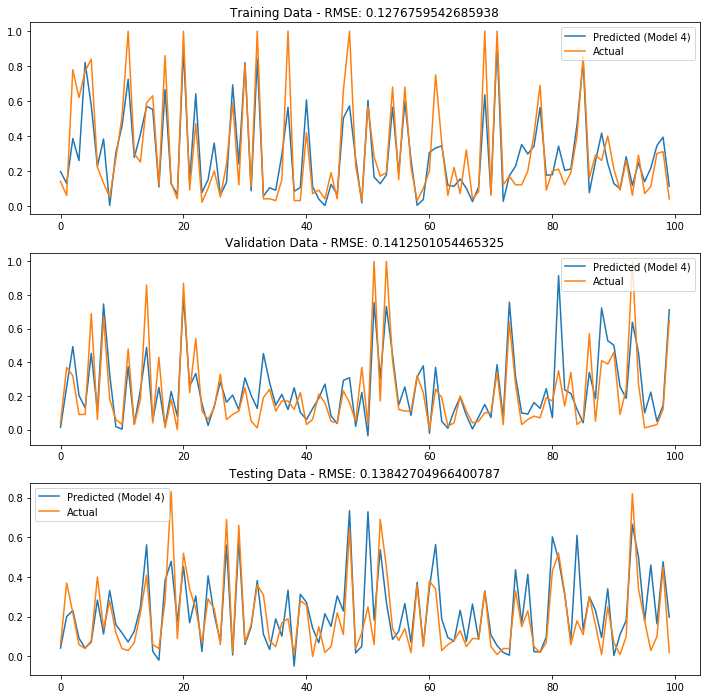

In [27]:
pred_val = model5.predict(X_val_str)
pred_val = y_scaler.inverse_transform(pred_val).reshape(-1,) #This rescale the prediction to the original data scale
lasso_model_pred_val = pred_val # Copy for final plot
RMSE_val = np.sqrt(mean_squared_error(y_val, pred_val))
pred_test = model5.predict(X_test_str)
pred_test = y_scaler.inverse_transform(pred_test).reshape(-1,) #This rescale the prediction to the original data scale
lasso_model_pred_test = pred_test # Copy for final plot
RMSE_test = np.sqrt(mean_squared_error(y_test, pred_test))

fig = plt.figure(figsize=[12, 12])
ax = fig.add_subplot(3, 1, 1)
ax.plot(pred_train[0:100], label='Predicted (Model 4)')
ax.plot(y_train[0:100], label='Actual')
ax.set_title('Training Data - RMSE: %s' %RMSE_train)
ax.legend()

ax = fig.add_subplot(3, 1, 2)
ax.plot(pred_val[0:100], label='Predicted (Model 4)')
ax.plot(y_val[0:100], label='Actual')
ax.set_title('Validation Data - RMSE: %s' %RMSE_val)
ax.legend()

ax = fig.add_subplot(3, 1, 3)
ax.plot(pred_test[0:100], label='Predicted (Model 4)')
ax.plot(y_test[0:100], label='Actual')
ax.set_title('Testing Data - RMSE: %s' %RMSE_test)
ax.legend();

Number of Coefficients equal to 0: 37 



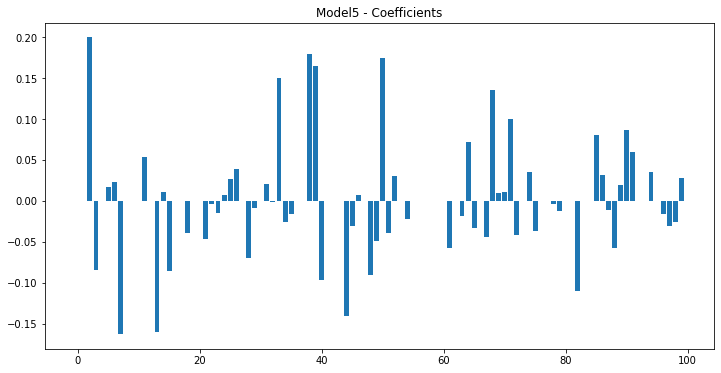

In [28]:
print('Number of Coefficients equal to 0: %s \n' %sum(model5.coef_ == 0))

#Lasso Coeff
fig = plt.figure(figsize=[12, 6])
ax = fig.add_subplot(1, 1, 1)
ax.bar(range(len(model5.coef_)), model5.coef_)
ax.set_title('Model5 - Coefficients');

## Final Evaluation - Standardise Data

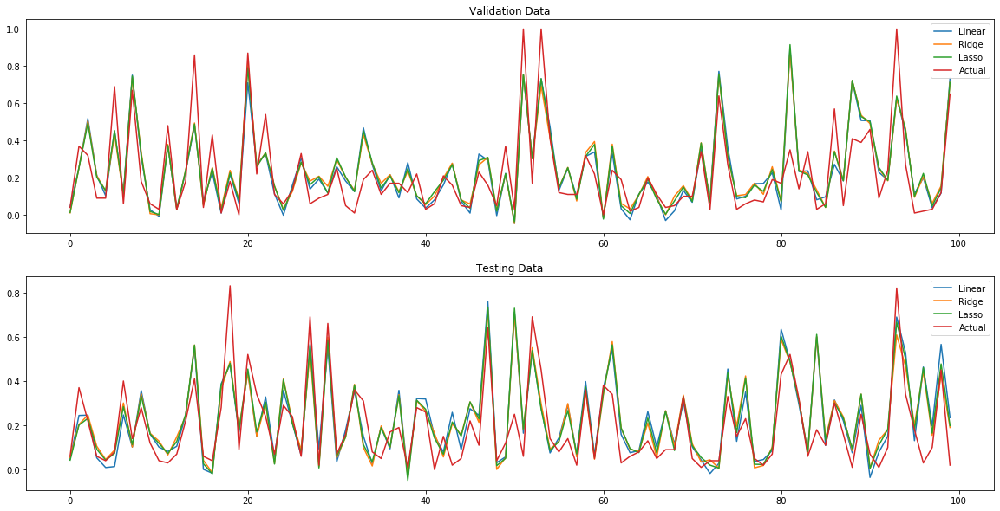

In [29]:
fig = plt.figure(figsize=[20, 10])
ax = fig.add_subplot(2, 1, 1)
ax.plot(linear_model_pred_val[0:100], label='Linear')
ax.plot(ridge_model_pred_val[0:100], label='Ridge')
ax.plot(lasso_model_pred_val[0:100], label='Lasso')
ax.plot(y_val[0:100], label='Actual')
ax.legend()
ax.set_title('Validation Data')
ax = fig.add_subplot(2, 1, 2)
ax.plot(linear_model_pred_test[0:100], label='Linear')
ax.plot(ridge_model_pred_test[0:100], label='Ridge')
ax.plot(lasso_model_pred_test[0:100], label='Lasso')
ax.plot(y_test[0:100], label='Actual')
ax.legend()
ax.set_title('Testing Data');

In [30]:
print('Linear Model, Test RMSE: ' + str(mean_squared_error(y_test, linear_model_pred_test,squared=False)))
print('Ridge Model, Test RMSE:  ' + str(mean_squared_error(y_test, ridge_model_pred_test,squared=False)))
print('Lasso Model, Test RMSE:  ' + str(mean_squared_error(y_test, lasso_model_pred_test,squared=False)))

Linear Model, Test RMSE: 0.13939197622700775
Ridge Model, Test RMSE:  0.13822475386791258
Lasso Model, Test RMSE:  0.13842704966400787
